## 1. Import Libraries & Dataset 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

In [2]:
df = pd.read_csv('./data/water_potability.csv')
df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [716]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [717]:
df.isnull().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

## 2. Exploratory Data Analysis 

In [718]:
columns = [col for col in df.columns[:-1]]

Visualisasi Boxplot & Swarmplot

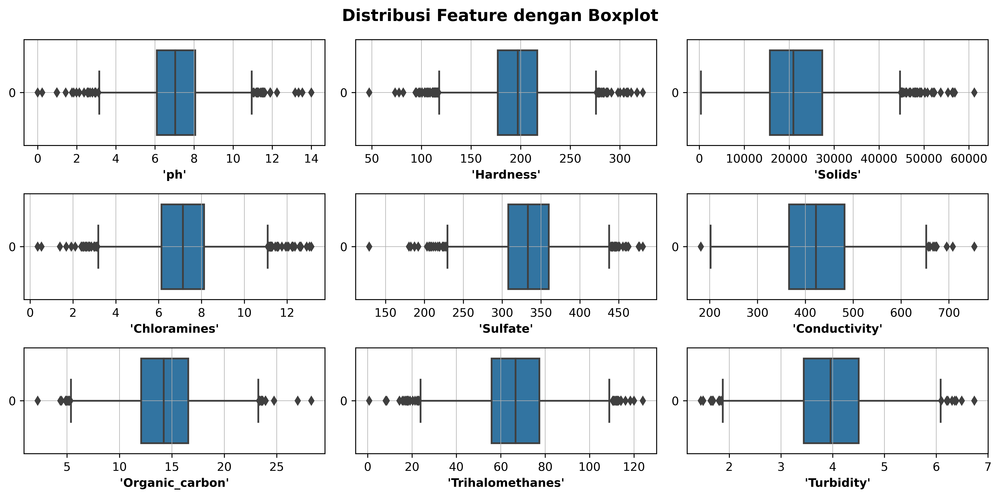

In [719]:
fig, ax = plt.subplots(3, 3, figsize=(12, 6), dpi=600)
ax = ax.flatten()
plt.suptitle("Distribusi Feature dengan Boxplot", fontsize=14, fontweight='bold')

for col, index in zip(columns, range(len(columns))):
    sns.boxplot(ax=ax[columns.index(col)], data=df[col], orient='h')
    ax[columns.index(col)].grid(linewidth=0.5)
    ax[columns.index(col)].set_xlabel(f"'{col}'", fontsize=10, fontweight='bold')
    ax[columns.index(col)].set_ylabel(None)

plt.tight_layout()
plt.show()

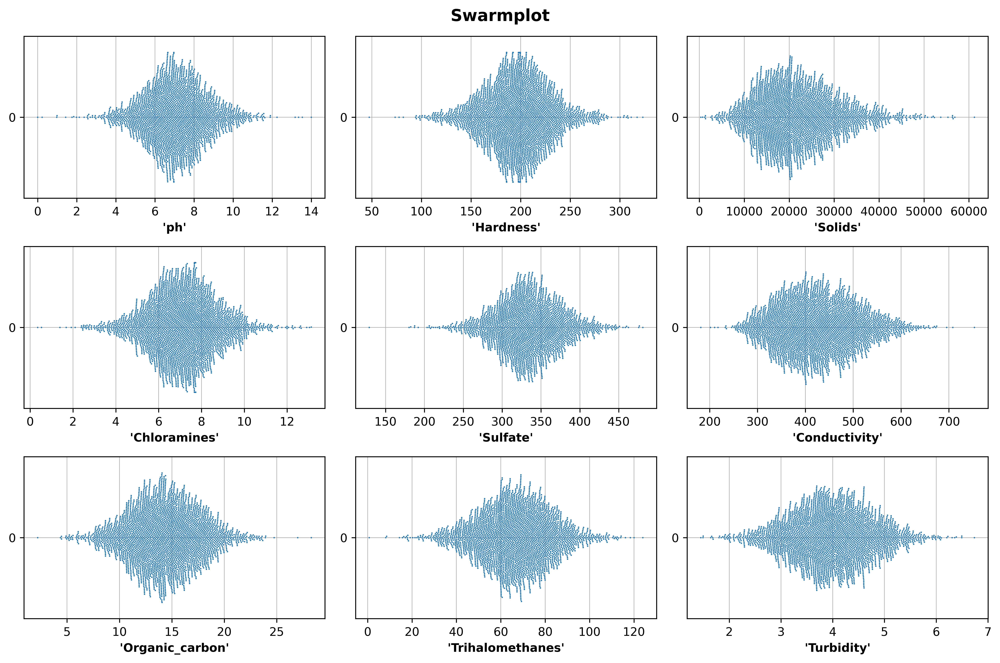

In [720]:
fig, ax = plt.subplots(3, 3, figsize=(12, 8), dpi=600)
ax = ax.flatten()
plt.suptitle("Swarmplot", fontsize=14, fontweight='bold')

for col, index in zip(columns, range(len(columns))):
    sns.swarmplot(ax=ax[columns.index(col)], data=df[col], orient='h', size=1.2)
    ax[columns.index(col)].grid(linewidth=0.5)
    ax[columns.index(col)].set_xlabel(f"'{col}'", fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

Visualisasi dengan Pairplot

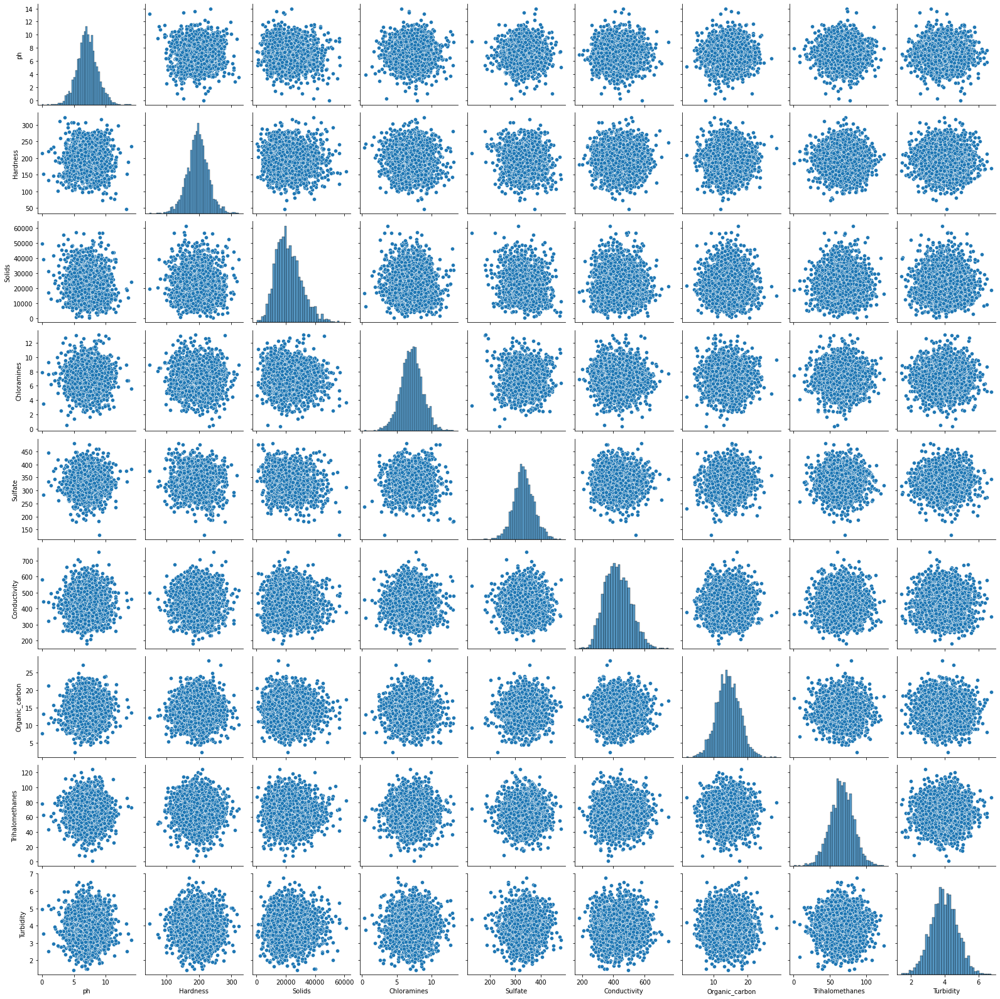

In [721]:
sns.pairplot(df[columns]);

Melihat lebih jelas distribusi data dengan Histplot

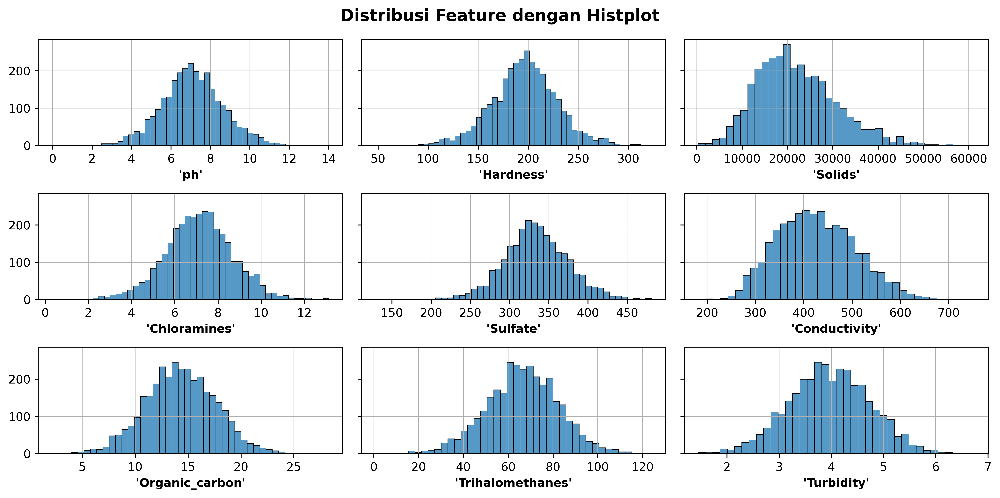

In [722]:
fig, ax = plt.subplots(3, 3, figsize=(12, 6), dpi=600, sharey=True)
ax = ax.flatten()
plt.suptitle("Distribusi Feature dengan Histplot", fontsize=14, fontweight='bold')

for col, index in zip(columns, range(len(columns))):
    sns.histplot(ax=ax[columns.index(col)], data=df[col])
    ax[columns.index(col)].grid(linewidth=0.5)
    ax[columns.index(col)].set_xlabel(f"'{col}'", fontsize=10, fontweight='bold')
    ax[columns.index(col)].set_ylabel(None)

plt.tight_layout()
plt.show()

Melihat lebih jelas korelasi tiap data dengan Heatmap

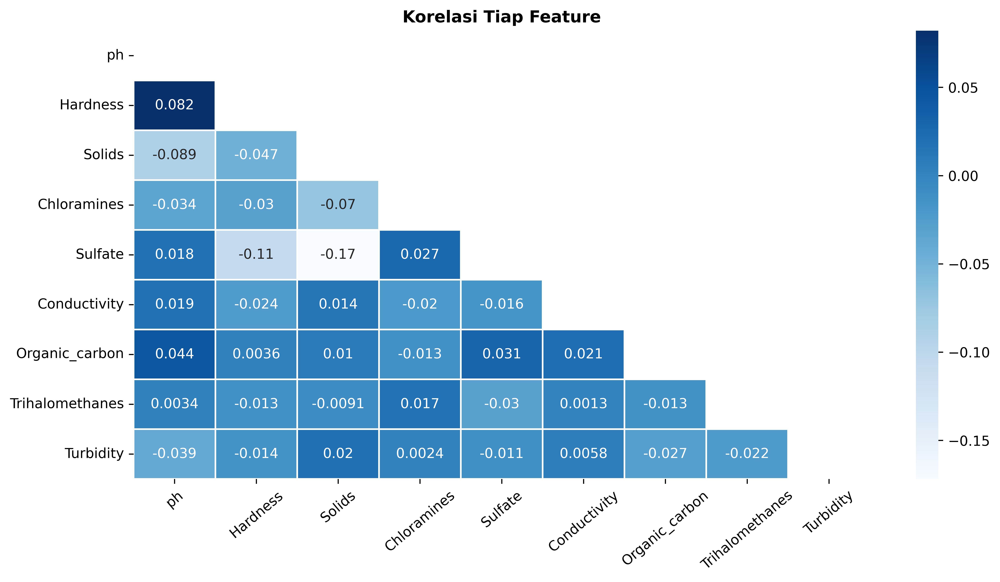

In [723]:
fig, ax = plt.subplots(figsize=(12, 6), dpi=600)
mask = np.triu(df[columns].corr())

sns.heatmap(df[columns].corr(), annot=True, cmap='Blues', mask=mask, linewidths=1)

plt.xticks(rotation=40)
plt.title("Korelasi Tiap Feature", fontsize=12, fontweight='bold')
plt.show()

Melihat perbandingan data target

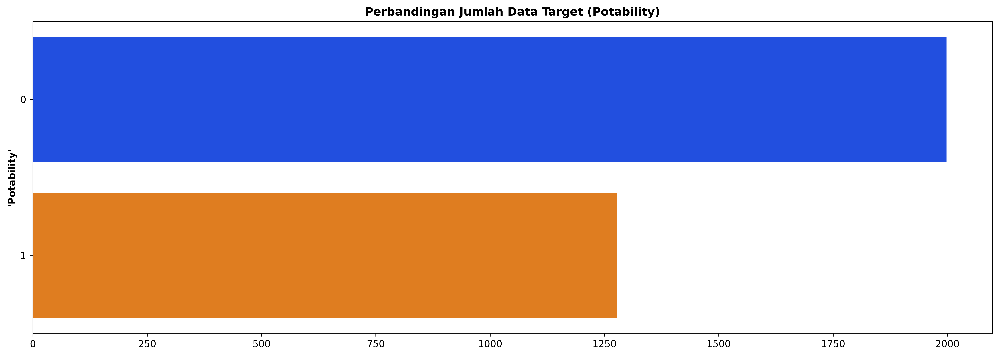

In [724]:
fig, ax = plt.subplots(figsize=(18, 6), dpi=600)
sns.countplot(y='Potability', data=df, palette='bright')
plt.title('Perbandingan Jumlah Data Target (Potability)', fontweight='bold')
plt.ylabel("'Potability'", fontweight='bold')
plt.xlabel(None)
plt.show()

## 3. Data Preprocessing 

### 3.1 Handling Missing Value 

Berdasarkan pengamatan Histplot, semua feature (yang kesemuanya feature numerik) memiliki data yang hampir terditribusi normal sehingga data yang bernilai kosong dapat diganti dengan nilai mean.

In [725]:
df.fillna(df.mean(), inplace=True)

In [726]:
df.tail()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
3271,4.668102,193.681735,47580.991603,7.166639,359.948574,526.424171,13.894419,66.687695,4.435821,1
3272,7.808856,193.553212,17329.802160,8.061362,333.775777,392.449580,19.903225,66.396293,2.798243,1
3273,9.419510,175.762646,33155.578218,7.350233,333.775777,432.044783,11.039070,69.845400,3.298875,1
3274,5.126763,230.603758,11983.869376,6.303357,333.775777,402.883113,11.168946,77.488213,4.708658,1
3275,7.874671,195.102299,17404.177061,7.509306,333.775777,327.459760,16.140368,78.698446,2.309149,1


### 3.2 Remove Outliers 

Dalam visualisasi sebelumnya, khususnya pada visualisasi Boxplot, banyak ditemukan Outliers pada setiap kolom. Outliers akan dihilangkan berdasarkan IQR.

In [727]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)

IQR = Q3 - Q1
print(IQR)

ph                     1.592377
Hardness              39.816918
Solids             11666.071830
Chloramines            1.987466
Sulfate               33.291119
Conductivity         116.057890
Organic_carbon         4.491850
Trihalomethanes       20.018954
Turbidity              1.060609
Potability             1.000000
dtype: float64


In [728]:
df.shape

(3276, 10)

In [729]:
df = df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [730]:
df.shape

(2666, 10)

### 3.3 Balancing Data Target 

Berdasarkan visualisasi Countplot terlihat bahwa data target tidak seimbang (imbalance target data), data yang bernilai 0 lebih banyak dari data yang bernilai 1. Dengan begitu perlu dilakukannya metode balancing data dengan undersampling agar dapat meningkatkan kinerja model nantinya. Undersampling adalah membuang data mayoritas agar sama dengan jumlah data minoritas pada kelas tertentu. Dalam kasus ini, data mayoritas ialah data target yang ber-label 0.

In [731]:
negatif = df.loc[df['Potability'] == 0]
positif = df.loc[df['Potability'] == 1]

print(f"Jumlah data target berlabel negatif:\t{len(negatif)}")
print(f"Jumlah data target berlabel positif:\t{len(positif)}")

Jumlah data target berlabel negatif:	1671
Jumlah data target berlabel positif:	995


In [732]:
negatif = negatif[:len(positif)]

print("Setelah Undersampling")
print(f"Jumlah data target berlabel negatif:\t{len(negatif)}")
print(f"Jumlah data target berlabel positif:\t{len(positif)}")

Setelah Undersampling
Jumlah data target berlabel negatif:	995
Jumlah data target berlabel positif:	995


In [733]:
df = pd.concat([negatif, positif], ignore_index=True)

### 3.4 Feature Scaling 

Feature scaling dengan menggunakan MinMaxScaler agar data memiliki rentang nilai yang sama untuk setiap kolomnya

In [734]:
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

scaled_data

array([[0.50049581, 0.54750164, 0.45676042, ..., 0.75408999, 0.2509305 ,
        0.        ],
       [0.66085409, 0.67080348, 0.43668518, ..., 0.4930792 , 0.27320558,
        0.        ],
       [0.69512653, 0.60794182, 0.48469753, ..., 0.92348859, 0.65074519,
        0.        ],
       ...,
       [0.86877776, 0.3618535 , 0.73825501, ..., 0.53654075, 0.33152068,
        1.        ],
       [0.1927908 , 0.71138718, 0.256243  , ..., 0.63351554, 0.66992128,
        1.        ],
       [0.62550908, 0.48511614, 0.37964605, ..., 0.64887142, 0.09394935,
        1.        ]])

In [735]:
df = pd.DataFrame(scaled_data, index=df.index, columns=df.columns)

df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,0.500496,0.547502,0.456760,0.520207,0.760701,0.804335,0.280742,0.754090,0.250931,0.0
1,0.660854,0.670803,0.436685,0.770560,0.498929,0.481211,0.643817,0.493079,0.273206,0.0
2,0.695127,0.607942,0.484698,0.616401,0.673067,0.358484,0.731546,0.923489,0.650745,0.0
3,0.817239,0.395881,0.392733,0.424711,0.320801,0.436423,0.346683,0.056319,0.517838,0.0
4,0.264806,0.441846,0.637924,0.551209,0.445450,0.174862,0.169951,0.347135,0.154093,0.0


## 4. Splitting & Modeling 

In [736]:
X = df.drop(columns='Potability')
y = df['Potability']

In [737]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [738]:
model = RandomForestClassifier()
model.fit(X_train, y_train)

RandomForestClassifier()

In [739]:
model.score(X_test, y_test)

0.6206030150753769

In [740]:
print(classification_report(y_test, model.predict(X_test)))

              precision    recall  f1-score   support

         0.0       0.62      0.61      0.62       199
         1.0       0.62      0.63      0.62       199

    accuracy                           0.62       398
   macro avg       0.62      0.62      0.62       398
weighted avg       0.62      0.62      0.62       398



## 5. Model Evaluation 

### 5.1 Hyperparameter Tuning dengan GridSeacrhCV 

In [741]:
pipeline = Pipeline([
    ('algo', RandomForestClassifier())
])

In [742]:
parameters = {
    'algo__max_depth': [10, 20, 30, 40, None],
    'algo__bootstrap': [True, False],
    'algo__n_estimators': [10, 100, 1000],
    'algo__max_features': ['sqrt', 'log2'],    
}

In [743]:
new_model = GridSearchCV(pipeline, parameters, cv=4, verbose=1)
new_model.fit(X_train, y_train)

Fitting 4 folds for each of 60 candidates, totalling 240 fits


GridSearchCV(cv=4,
             estimator=Pipeline(steps=[('algo', RandomForestClassifier())]),
             param_grid={'algo__bootstrap': [True, False],
                         'algo__max_depth': [10, 20, 30, 40, None],
                         'algo__max_features': ['sqrt', 'log2'],
                         'algo__n_estimators': [10, 100, 1000]},
             verbose=1)

In [744]:
new_model.score(X_test, y_test)

0.6331658291457286

In [745]:
new_model.best_params_

{'algo__bootstrap': True,
 'algo__max_depth': 40,
 'algo__max_features': 'sqrt',
 'algo__n_estimators': 1000}

In [746]:
model.score(X_test, y_test), new_model.score(X_test, y_test)

(0.6206030150753769, 0.6331658291457286)

In [747]:
print(classification_report(y_test, new_model.predict(X_test)))

              precision    recall  f1-score   support

         0.0       0.63      0.65      0.64       199
         1.0       0.64      0.62      0.63       199

    accuracy                           0.63       398
   macro avg       0.63      0.63      0.63       398
weighted avg       0.63      0.63      0.63       398



###  5.2 Confusion Matrix

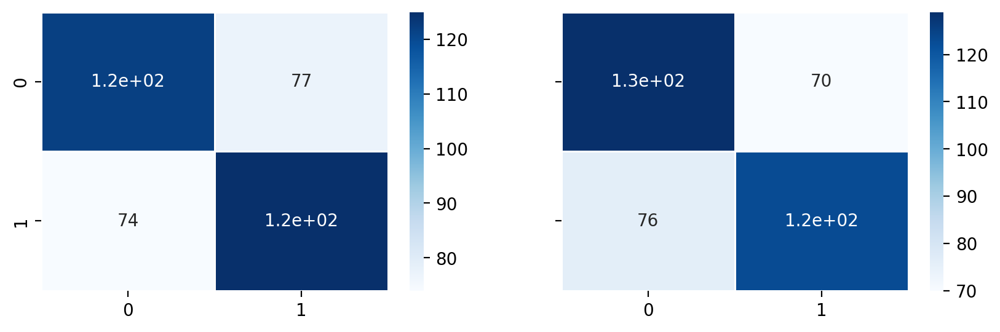

In [748]:
mx_1 = confusion_matrix(y_test, model.predict(X_test))
mx_2 = confusion_matrix(y_test, new_model.predict(X_test))

fig, ax = plt.subplots(1, 2, figsize=(10, 3), dpi=200, sharey=True)
ax = ax.flatten()
sns.heatmap(mx_1, ax=ax[0], cmap='Blues', annot=True, linewidths=1)
sns.heatmap(mx_2, ax=ax[1], cmap='Blues', annot=True, linewidths=1)

plt.show()

MODEL PERTAMA

In [749]:
print(f"True Positif\t:{round(mx_1[0][0] / (mx_1[0][0] + mx_1[0][1]) * 100, 3)}%\t-> {mx_1[0][0]}")
print(f"True Negatif\t:{round(mx_1[1][1] / (mx_1[1][1] + mx_1[1][0]) * 100, 3)}%\t-> {mx_1[1][1]}")

True Positif	:61.307%	-> 122
True Negatif	:62.814%	-> 125


MODEL KEDUA

In [750]:
print(f"True Positif\t:{round(mx_2[0][0] / (mx_2[0][0] + mx_2[0][1]) * 100, 3)}%\t-> {mx_2[0][0]}")
print(f"True Negatif\t:{round(mx_2[1][1] / (mx_2[1][1] + mx_2[1][0]) * 100, 3)}%\t-> {mx_2[0][0]}")

True Positif	:64.824%	-> 129
True Negatif	:61.809%	-> 129


## 6. Save Model 

In [751]:
import pickle

In [752]:
model_name = "water_potability.rf"
pickle.dump(model, open(model_name, 'wb'))

In [753]:
new_model_name = "new_water_potability.rf"
pickle.dump(new_model, open(new_model_name, 'wb'))